## Petfinder.my - Pawpularity Contest

In this competition, we will use machine learning to predict the "pawpularity" of a pet using images and metadata. If successful, solutions will be adapted into AI tools that will guide shelters and rescuers around the world to improve the appeal of their pet profiles, automatically enhancing photo quality and recommending composition improvements. As a result, stray dogs and cats can find families much faster, and these tools will help improve animal welfar

Link: https://www.kaggle.com/competitions/petfinder-pawpularity-score/overview

### Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
import cv2
import warnings
from PIL import Image
from glob import glob

plt.style.use('default')
sns.set_theme()
warnings.filterwarnings('ignore')

In [ ]:
%%capture
!unzip /content/sample_data/petfinder-pawpularity-score.zip

### Loading Data

Training Set

In [ ]:
train_df = pd.read_csv('/content/sample_data/train.csv')
print("Training data shape:", train_df.shape)
print("\nFirst few rows of the dataset:")
display(train_df.head())

Training data shape: (9912, 14)

First few rows of the dataset:


,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72


In [ ]:
#Get the image data (the .jpg data) and put it into lists of filenames
train_images = glob("/content/train/*.jpg")
print(f"Loaded {len(train_images)} images from train directory.")

Loaded 9912 images from train directory.


Testing Set

In [ ]:
test_df = pd.read_csv('test.csv')
print("Testing data shape:", test_df.shape)
print("\nFirst few rows of the dataset:")
display(test_df.head())

Testing data shape: (8, 13)

First few rows of the dataset:


,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur
0,4128bae22183829d2b5fea10effdb0c3,1,0,1,0,0,1,1,0,0,1,0,1
1,43a2262d7738e3d420d453815151079e,0,1,0,0,0,0,1,1,0,0,0,0
2,4e429cead1848a298432a0acad014c9d,0,0,0,1,0,1,1,1,0,1,1,1
3,80bc3ccafcc51b66303c2c263aa38486,1,0,1,0,0,0,0,0,0,0,1,0
4,8f49844c382931444e68dffbe20228f4,1,1,1,0,1,1,0,1,0,1,1,0


In [ ]:
test_images = glob("/content/test/*.jpg")
print(f"Loaded {len(test_images)} images from test directory.")

Loaded 8 images from test directory.


The train.csv and test.csv files contain metadata for photos in the training set and test set, respectively. Each pet photo is labeled with the value of 1 (Yes) or 0 (No) for each of the following features:

Focus - Pet stands out against uncluttered background, not too close / far.

Eyes - Both eyes are facing front or near-front, with at least 1 eye / pupil decently clear.

Face - Decently clear face, facing front or near-front.

Near - Single pet taking up significant portion of photo (roughly over 50% of photo width or height).

Action - Pet in the middle of an action (e.g., jumping).

Accessory - Accompanying physical or digital accessory / prop (i.e. toy, digital sticker), excluding collar and leash.

Group - More than 1 pet in the photo.

Collage - Digitally-retouched photo (i.e. with digital photo frame, combination of multiple photos).

Human - Human in the photo.

Occlusion - Specific undesirable objects blocking part of the pet (i.e. human, cage or fence). Note that not all blocking objects are considered occlusion.

Info - Custom-added text or labels (i.e. pet name, description).

Blur - Noticeably out of focus or noisy, especially for the pet’s eyes and face. For Blur entries, “Eyes” column is always set to 0.

### Initial Data Analysis

Descprition of Pawpolarity Score

In [ ]:
print("\nPawpularity Score Statistics:")
train_df['Pawpularity'].describe()


Pawpularity Score Statistics:


,Pawpularity
count,9912.000000
mean,38.039044
std,20.591990
min,1.000000
25%,25.000000
50%,33.000000
75%,46.000000
max,100.000000


Getting Information for Training Dataset

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9912 entries, 0 to 9911
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             9912 non-null   object
 1   Subject Focus  9912 non-null   int64 
 2   Eyes           9912 non-null   int64 
 3   Face           9912 non-null   int64 
 4   Near           9912 non-null   int64 
 5   Action         9912 non-null   int64 
 6   Accessory      9912 non-null   int64 
 7   Group          9912 non-null   int64 
 8   Collage        9912 non-null   int64 
 9   Human          9912 non-null   int64 
 10  Occlusion      9912 non-null   int64 
 11  Info           9912 non-null   int64 
 12  Blur           9912 non-null   int64 
 13  Pawpularity    9912 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 1.1+ MB


In [ ]:
# Checking null values
train_df.isnull().sum()

Id               0
Subject Focus    0
Eyes             0
Face             0
Near             0
Action           0
Accessory        0
Group            0
Collage          0
Human            0
Occlusion        0
Info             0
Blur             0
Pawpularity      0
dtype: int64

In [ ]:
# Checking duplicates
train_df.duplicated().sum()

0

### Exploratory Data Analysis

c:\Users\Asus\envs\test\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\Asus\envs\test\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


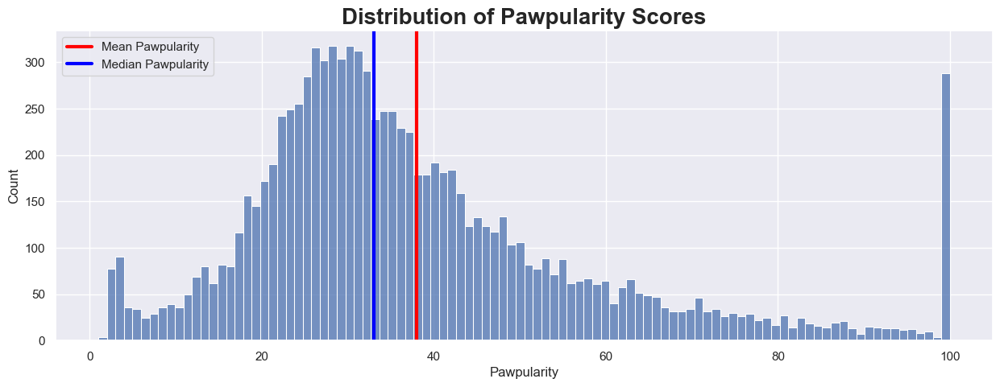

In [ ]:
# Distribution of Pawpularity scores
fig = plt.figure(figsize=(15,7))
sns.histplot(data=train_df, x='Pawpularity', bins=100)
plt.axvline(train_df['Pawpularity'].mean(), c='red', ls='-', lw=3, label='Mean Pawpularity')
plt.axvline(train_df['Pawpularity'].median(),c='blue',ls='-',lw=3, label='Median Pawpularity')
plt.title('Distribution of Pawpularity Scores', fontsize=20, fontweight='bold')
plt.legend()
plt.show()

Observation

1. The mean Pawpularity Score is around 40
2. Around 300 Pawpularity Score is of 100 which can be observed for what could be the intersting feature that this animal picture got the highest score

Correlation Matrix for features vs Pawpularity Score

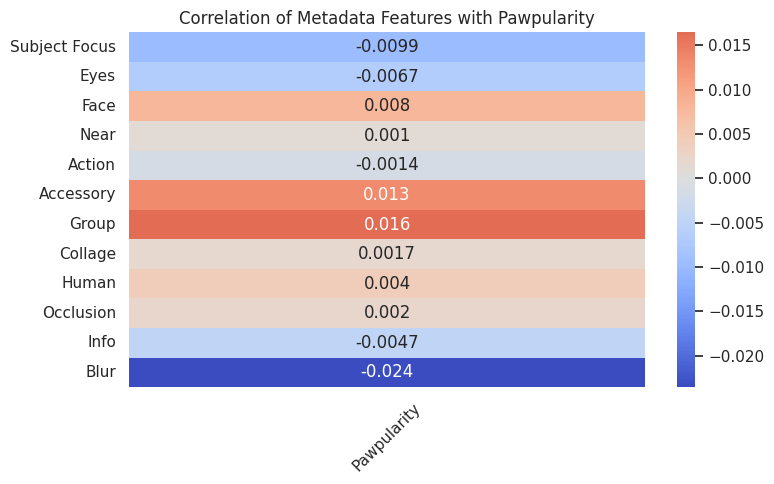

In [ ]:
# Analyze image metadata features
metadata_features = [col for col in train_df.columns if col not in ['Id', 'Pawpularity']]

# Compute correlation only with 'Pawpularity'
correlation = train_df[metadata_features + ['Pawpularity']].corr()['Pawpularity'].drop('Pawpularity')

# Plot heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(correlation.to_frame(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation of Metadata Features with Pawpularity')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Observation:

1. There is not much correlation between features and Pawpularity, the highest correlation which can be observed is towards the Subject focus, eyes, face and info.
2. There is a high correlation between occulsion and human, since human block the images
3. Then there is high correlation between eyes and face
4. Also there is significant correlation between eyes and Blur

Visualize the distribution of Pawpularity scores across each feature variable

In [ ]:
def meta_feature_dist(feature):
    tmp_cnt = train_df.groupby(feature)['Pawpularity'].mean()
    display(pd.DataFrame(tmp_cnt))
    fig, ax = plt.subplots(1,1,figsize=(15, 3))
    sns.histplot(x='Pawpularity',data=train_df,hue=feature,ax=ax)
    plt.show()


def meta_feature_samples(feature):
    colors = ["#ED2938", "#B25F4A", "#77945C", "#3BCA6D", "#00FF7F"]
    figs = plt.figure(constrained_layout=True, figsize=(12, 7))
    subfigs = figs.subfigures(5, 2, hspace=0.07)

    for idx, fig in enumerate(subfigs, 1):
        axes = fig[0].subplots(1, 3)
        fig[0].supylabel(f'<{idx*20}', fontweight='bold')
        fig[0].set_facecolor(colors[idx-1])

        # Select rows where the feature is 0
        train_sub = train_df[
            (train_df['Pawpularity'] <= idx * 20) &
            (train_df['Pawpularity'] > (idx - 1) * 20) &
            (train_df[feature] == 0)
        ].sample(3, random_state=0)

        for image_id, ax in zip(train_sub['Id'], axes):
            # Find the corresponding file path in train_images
            image_path = next((path for path in train_images if image_id in path), None)
            if image_path:
                img = Image.open(image_path)
                ax.imshow(img)
                ax.set_xticks([])
                ax.set_yticks([])

        axes = fig[1].subplots(1, 3)
        fig[1].set_facecolor(colors[idx-1])

        # Select rows where the feature is 1
        train_sub = train_df[
            (train_df['Pawpularity'] <= idx * 20) &
            (train_df['Pawpularity'] > (idx - 1) * 20) &
            (train_df[feature] == 1)
        ].sample(3, random_state=0)

        for image_id, ax in zip(train_sub['Id'], axes):
            # Find the corresponding file path in train_images
            image_path = next((path for path in train_images if image_id in path), None)
            if image_path:
                img = Image.open(image_path)
                ax.imshow(img)
                ax.set_xticks([])
                ax.set_yticks([])

    figs.suptitle(f'{feature} 0 & 1 samples', fontweight='bold', fontsize=20)
    figs.supylabel('Pawpularity', fontsize=18)

    plt.show()

Subject Focus

,Pawpularity
Subject Focus,
0,38.073252
1,36.835766


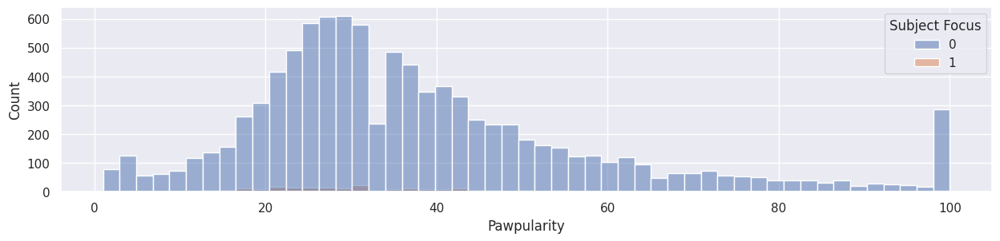

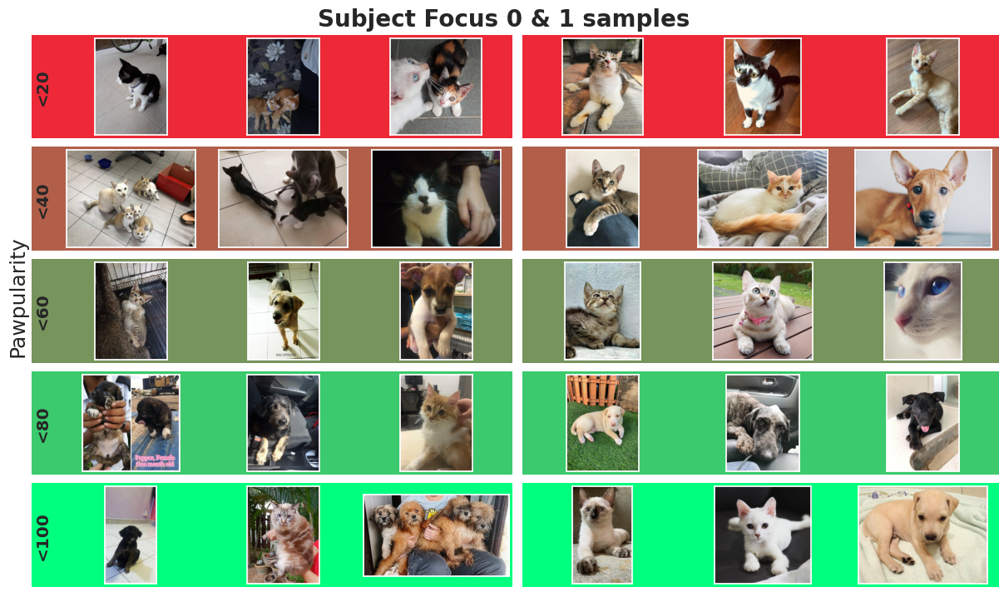

In [ ]:
meta_feature_dist('Subject Focus') #Mean
meta_feature_samples('Subject Focus') #Samples

Eyes

,Pawpularity
Eyes,
0,38.292813
1,37.964351


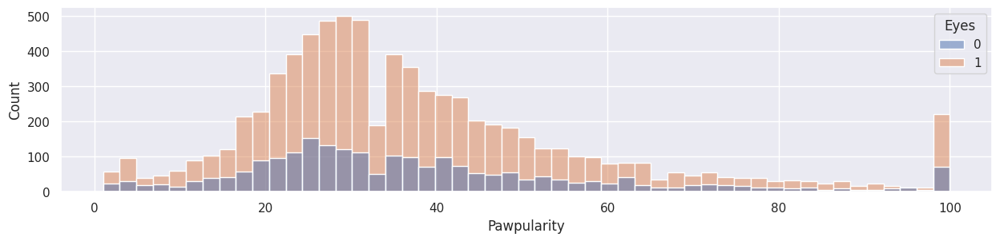

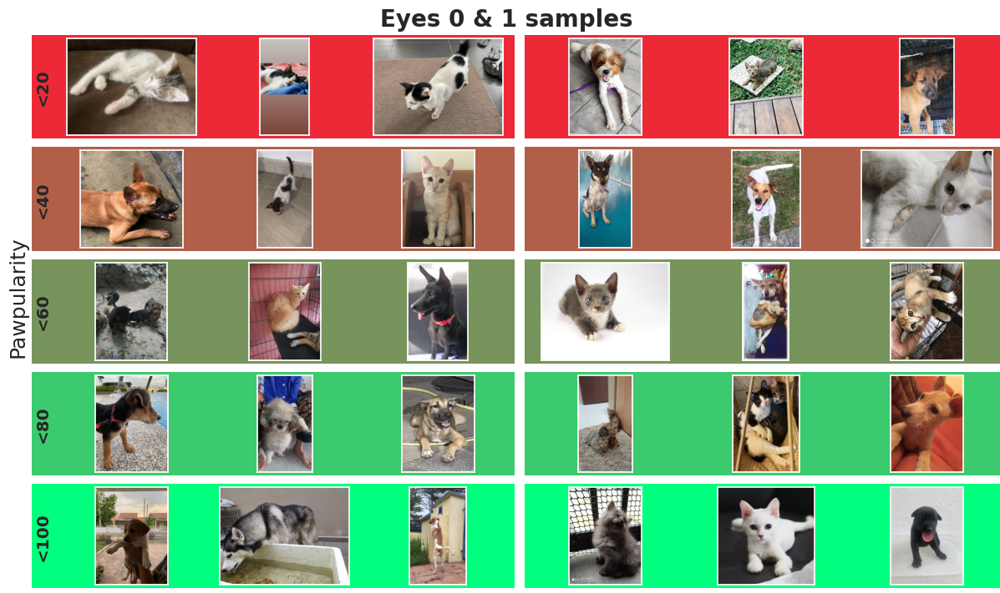

In [ ]:
meta_feature_dist('Eyes')
meta_feature_samples('Eyes')

Face

,Pawpularity
Face,
0,37.532563
1,38.092857


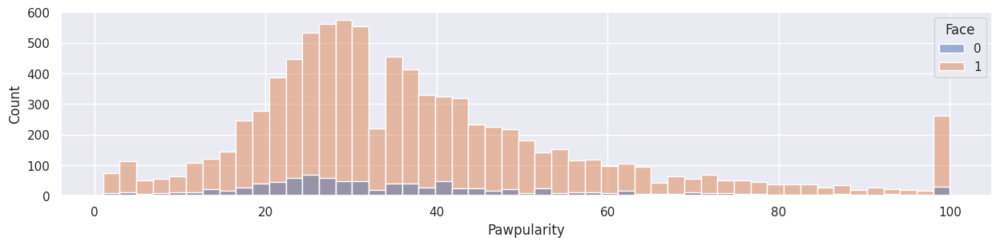

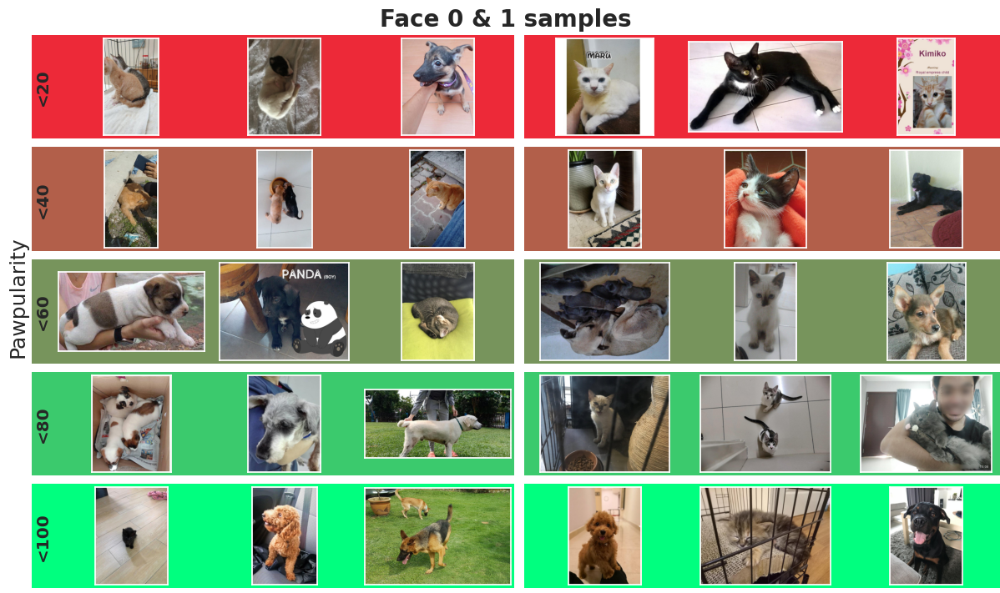

In [ ]:
meta_feature_dist('Face')
meta_feature_samples('Face')

 Near

,Pawpularity
Near,
0,37.987609
1,38.047307


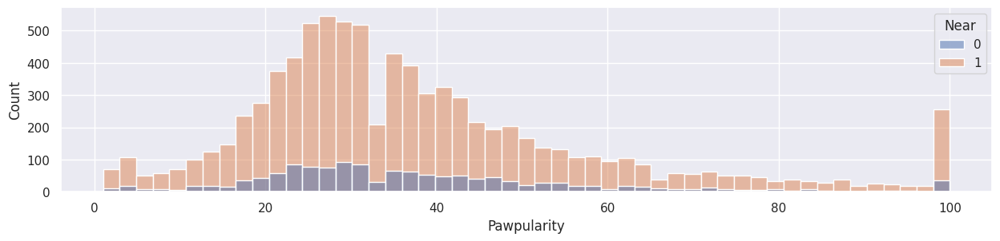

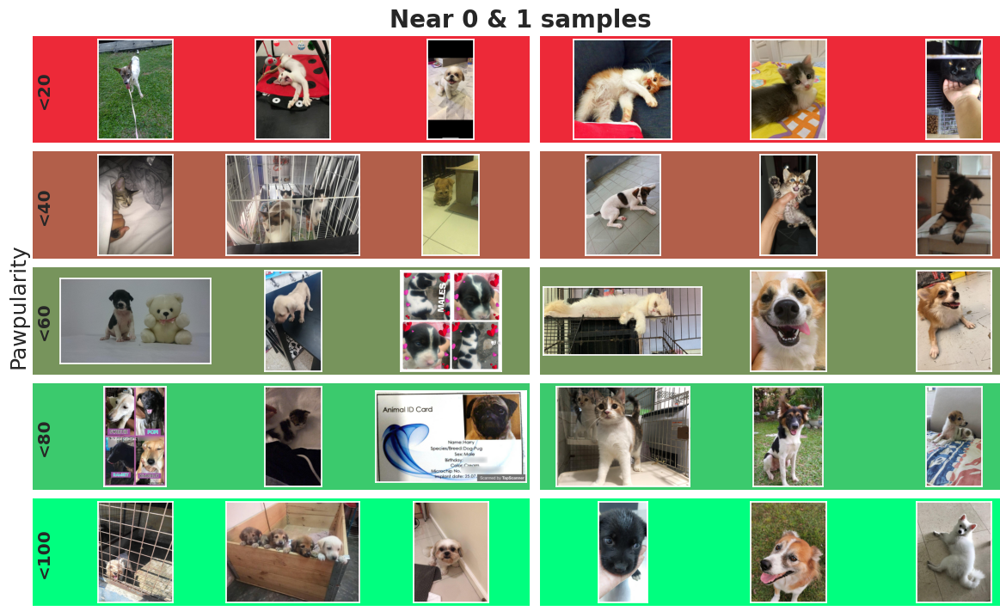

In [ ]:
meta_feature_dist('Near')
meta_feature_samples('Near')

Action

,Pawpularity
Action,
0,38.041883
1,37.757576


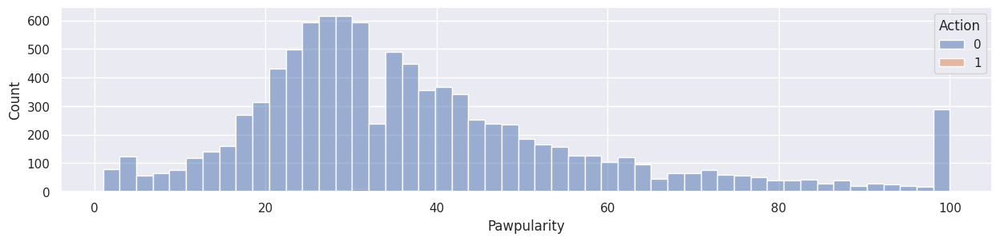

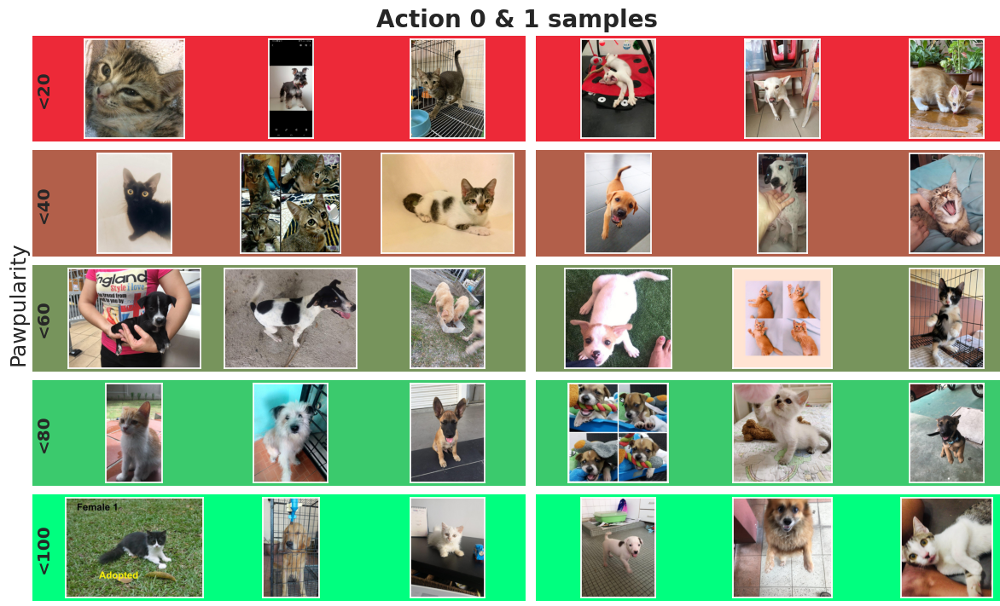

In [ ]:
meta_feature_dist('Action')
meta_feature_samples('Action')

Accessory

,Pawpularity
Accessory,
0,37.965260
1,39.053571


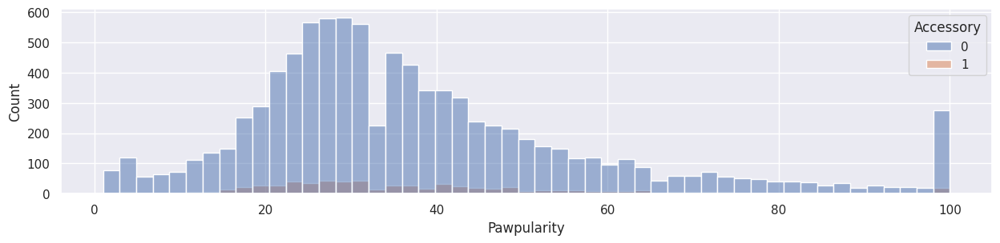

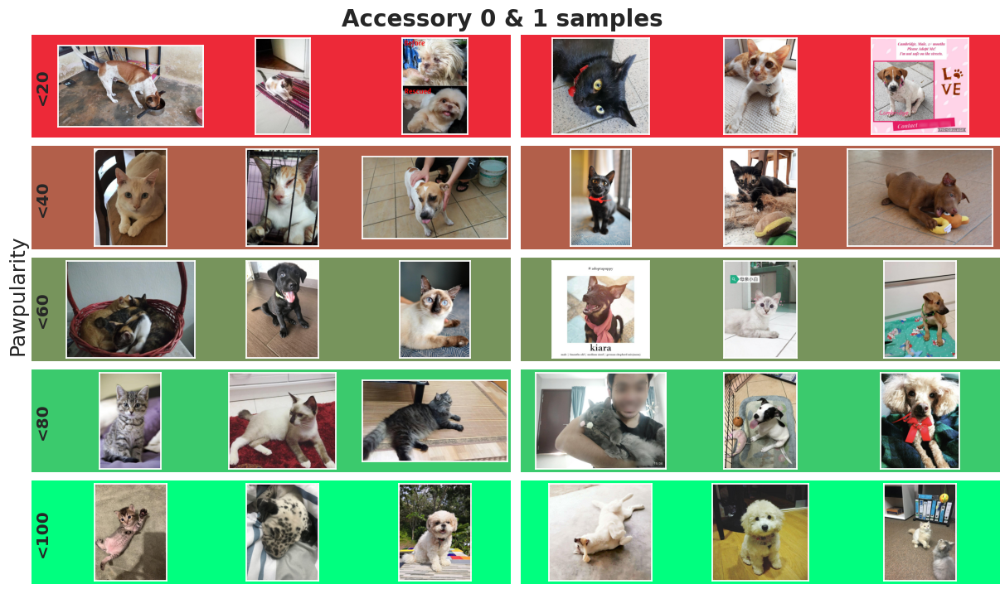

In [ ]:
meta_feature_dist('Accessory')
meta_feature_samples('Accessory')

Group

,Pawpularity
Group,
0,37.908343
1,38.918877


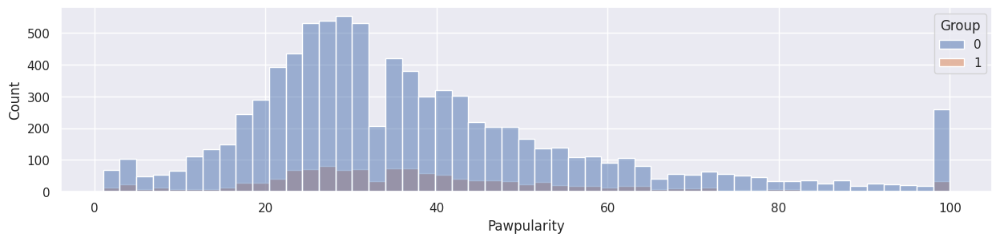

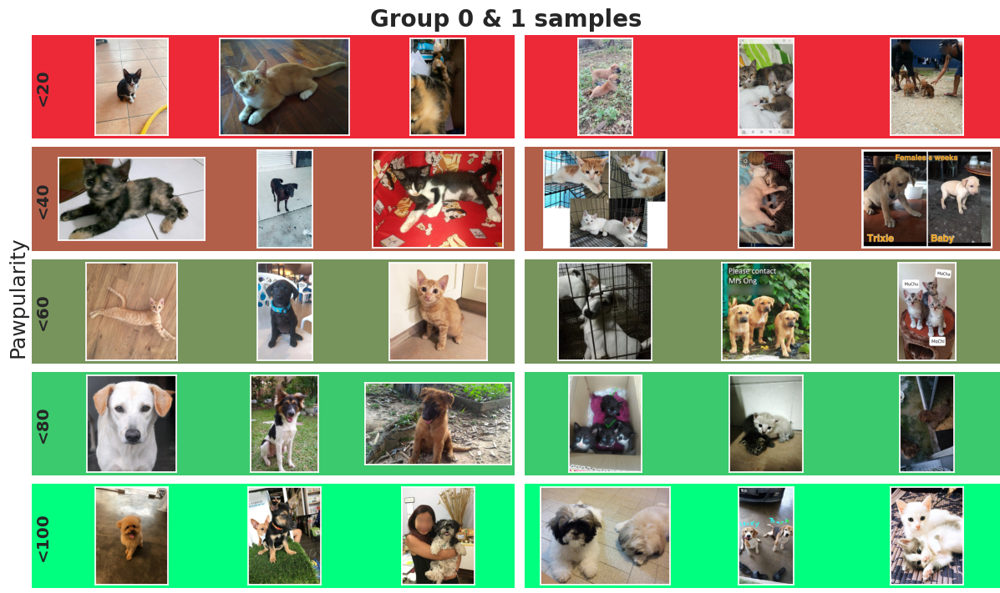

In [ ]:
meta_feature_dist('Group')
meta_feature_samples('Group')

Collage

,Pawpularity
Collage,
0,38.030892
1,38.195122


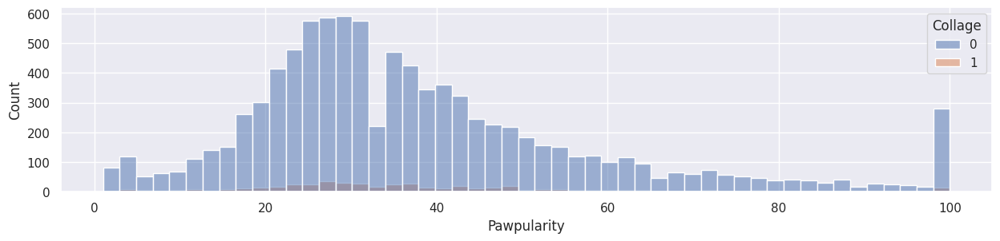

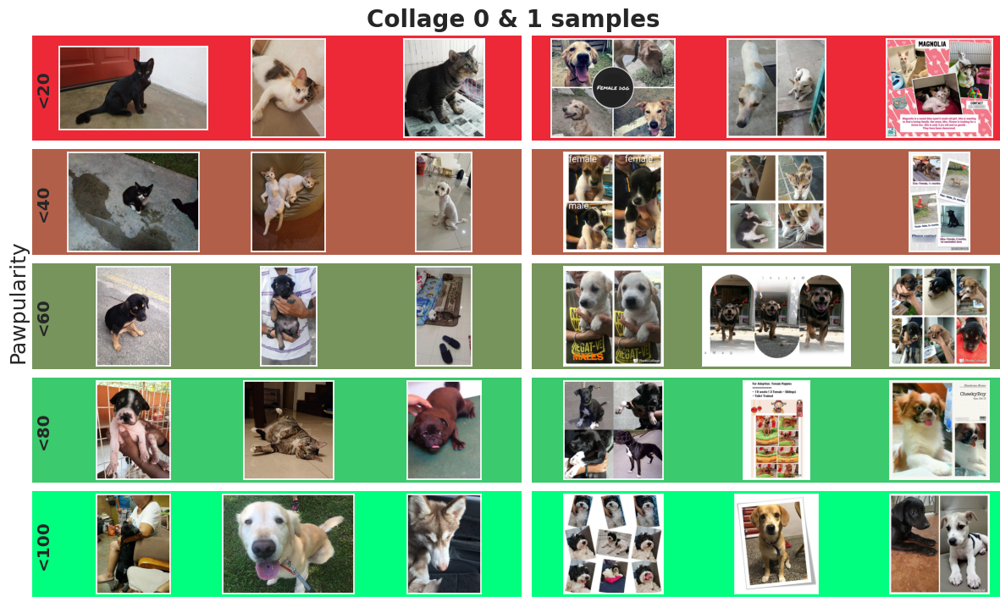

In [ ]:
meta_feature_dist('Collage')
meta_feature_samples('Collage')

Human

,Pawpularity
Human,
0,38.002420
1,38.222694


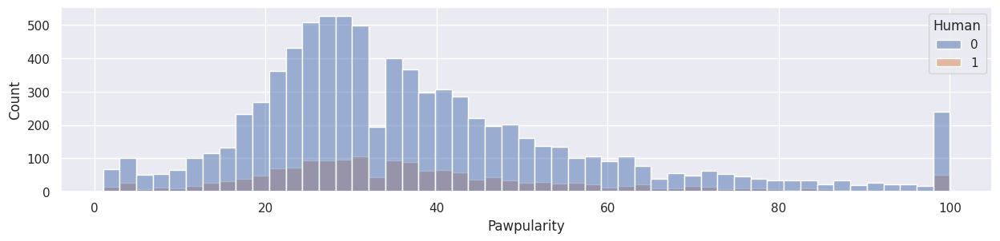

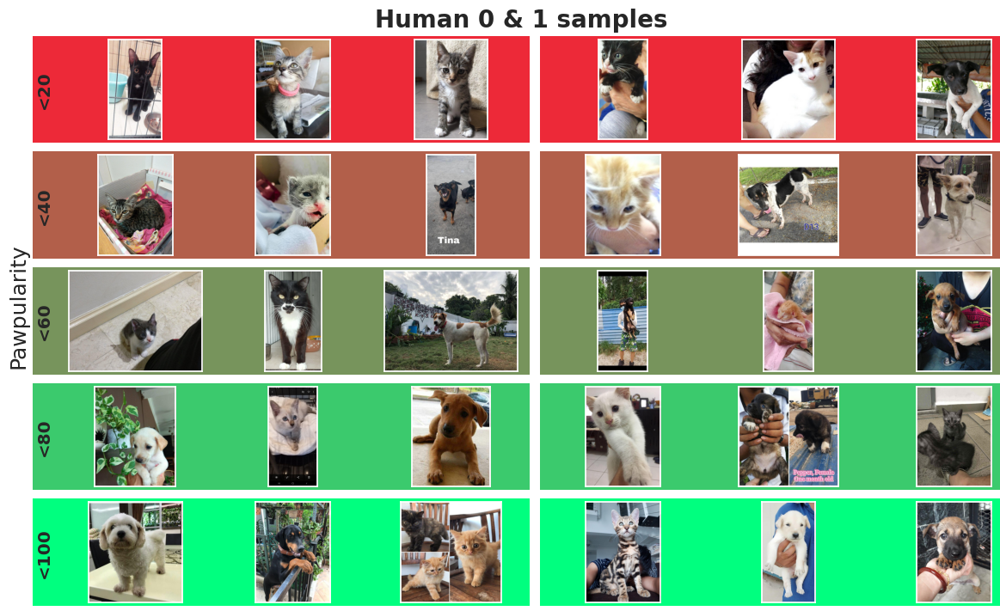

In [ ]:
meta_feature_dist('Human')
meta_feature_samples('Human')

Occlusion

,Pawpularity
Occlusion,
0,38.020470
1,38.128446


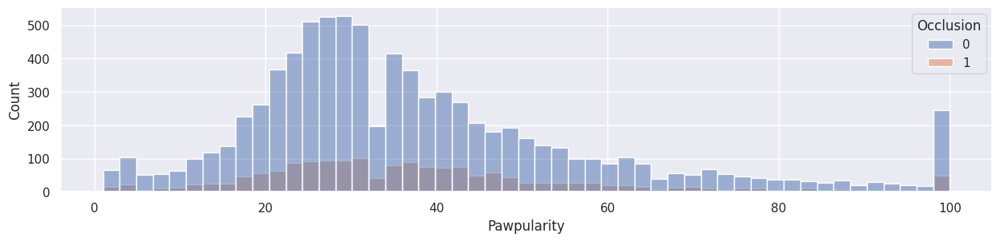

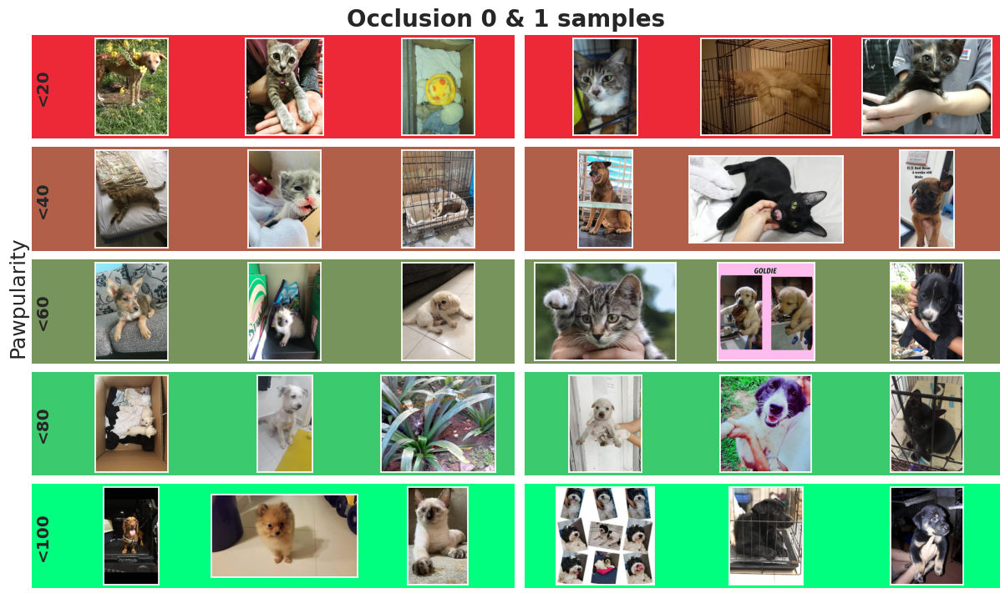

In [ ]:
meta_feature_dist('Occlusion')
meta_feature_samples('Occlusion')

Info

,Pawpularity
Info,
0,38.063944
1,37.657331


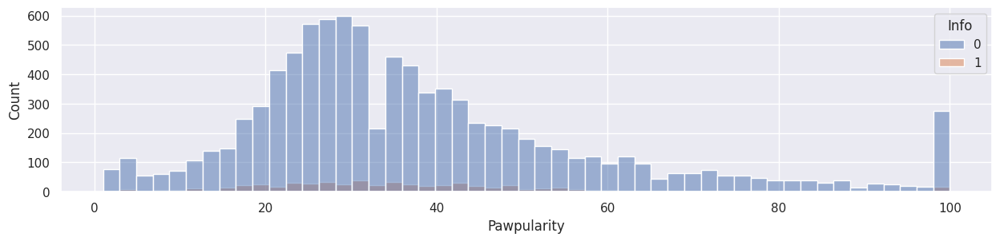

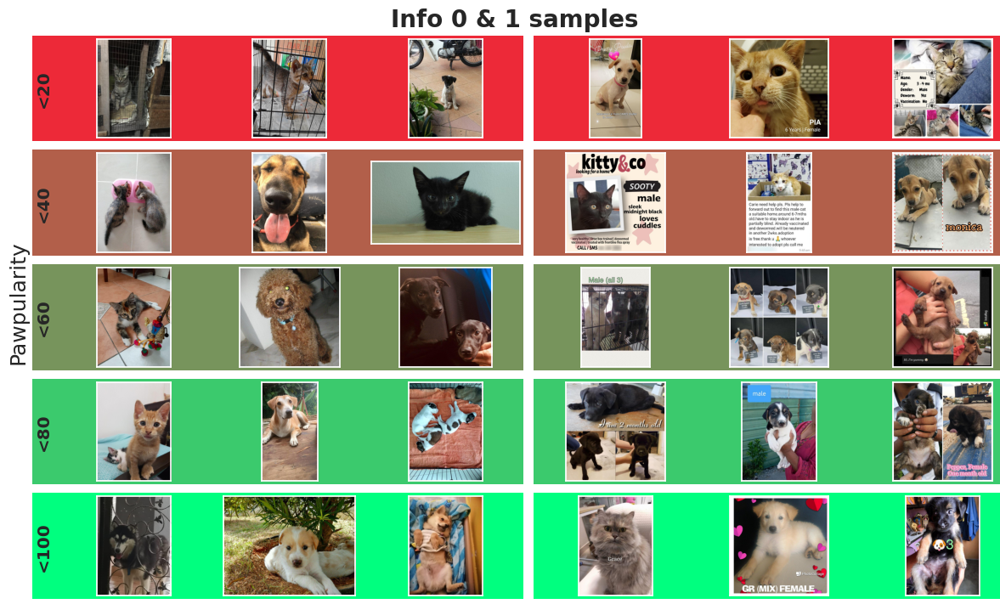

In [ ]:
meta_feature_dist('Info')
meta_feature_samples('Info')

Blur

,Pawpularity
Blur,
0,38.172455
1,36.277937


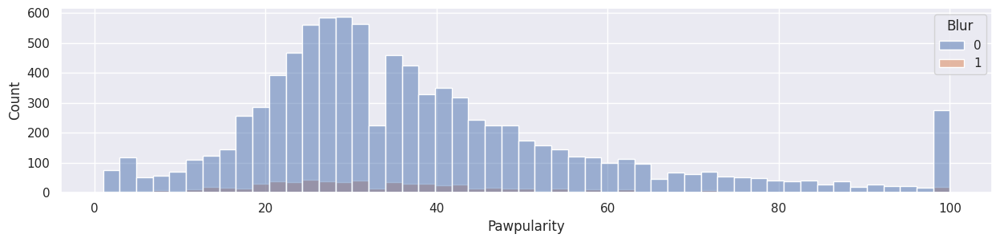

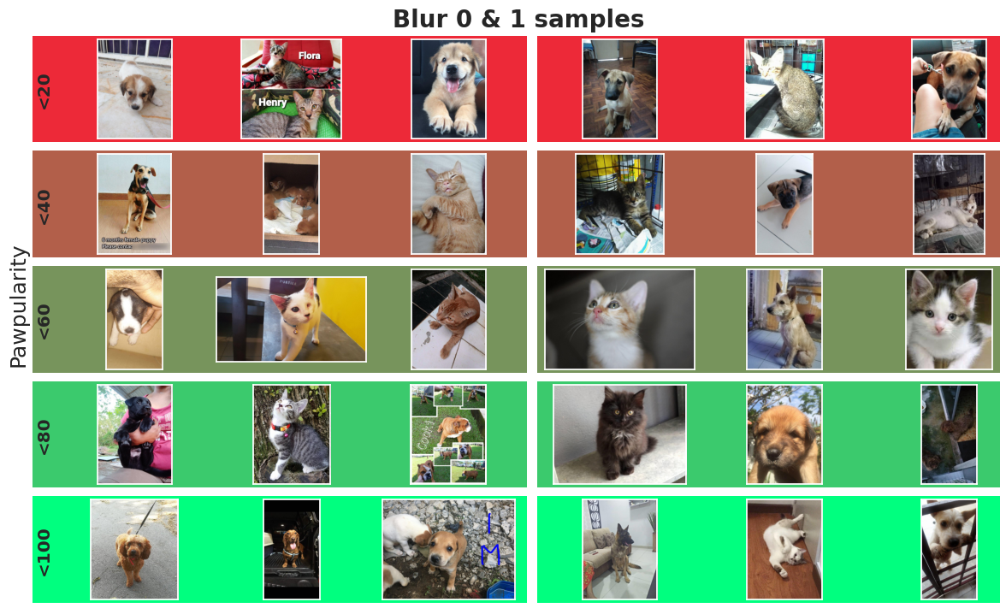

In [ ]:
meta_feature_dist('Blur')
meta_feature_samples('Blur')

Pawpularity Score is 100

In [ ]:
one_hundred = train_df[train_df['Pawpularity'] == 100]
print(len(one_hundred))

288


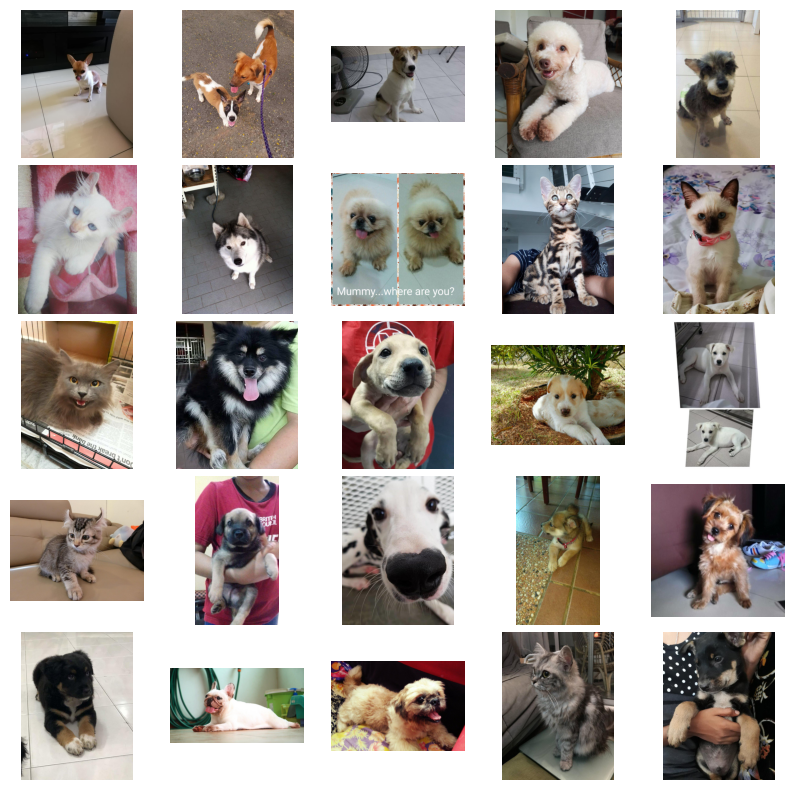

In [ ]:
fig, ax = plt.subplots(5, 5, figsize=(10, 10))

for idx, ax in enumerate(ax.flatten()):
    # Get the image path corresponding to the current ID
    image_id = one_hundred['Id'].iloc[idx]
    image_path = next((path for path in train_images if image_id in path), None)

    if image_path:
        ax.imshow(Image.open(image_path))
        ax.axis('off')

fig.subplots_adjust(hspace=0.05)
plt.show()


Pawpularity Score is less than 3

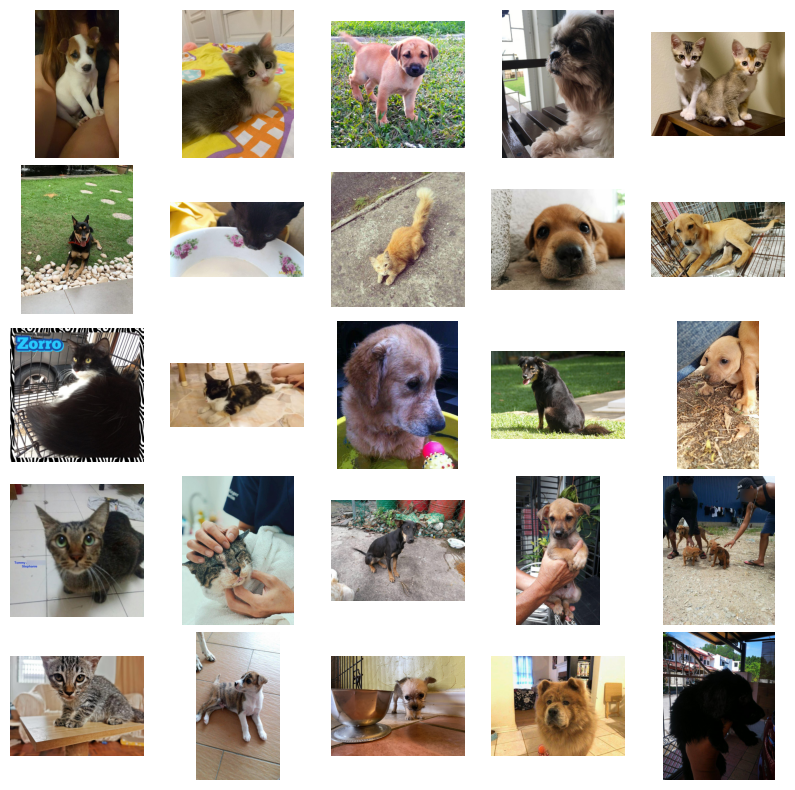

In [ ]:
one_two = train_df[train_df['Pawpularity'] < 3]
fig, ax = plt.subplots(5, 5, figsize=(10, 10))

for idx, ax in enumerate(ax.flatten()):
    # Get the image path corresponding to the current ID
    image_id = one_two['Id'].iloc[idx]
    image_path = next((path for path in train_images if image_id in path), None)

    if image_path:
        ax.imshow(Image.open(image_path))
        ax.axis('off')

fig.subplots_adjust(hspace=0.05)
plt.show()
